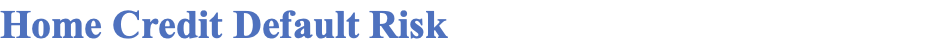

# Section 2: Abstract

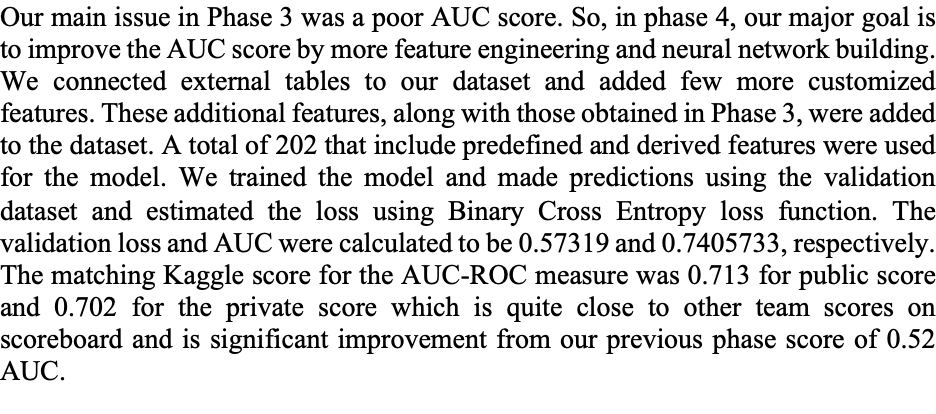

# Section 3: Data Description and Task Description

# Section 3.1: Data Description

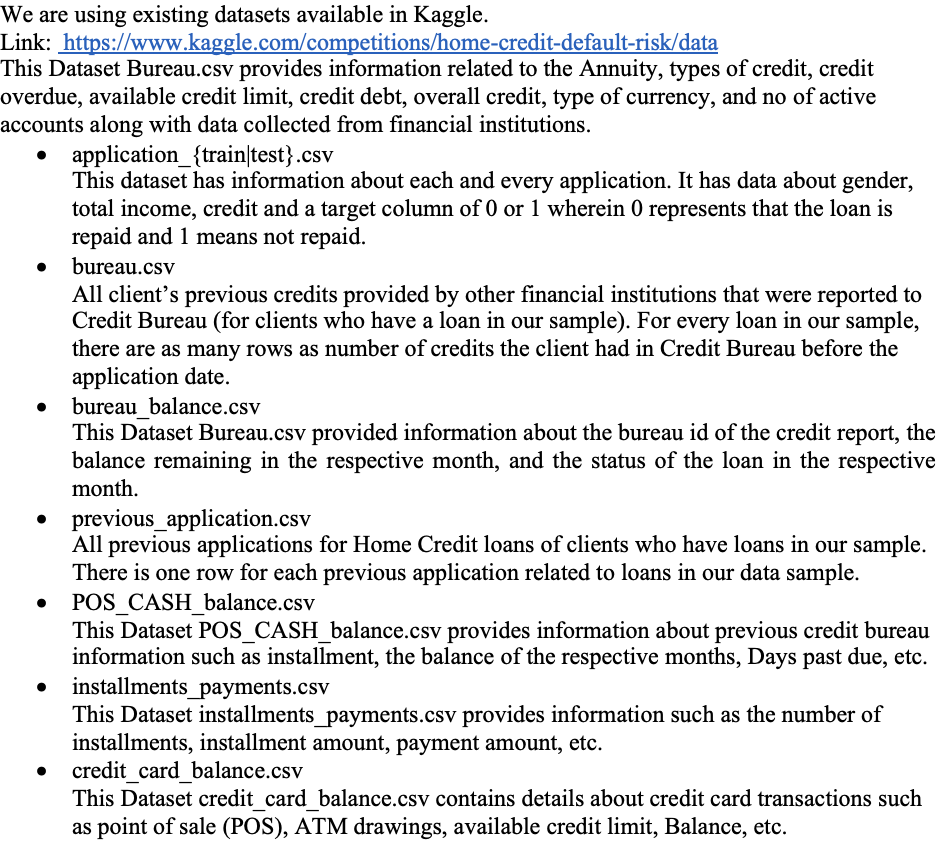

# Section 3.2: Tasks to be Tackled

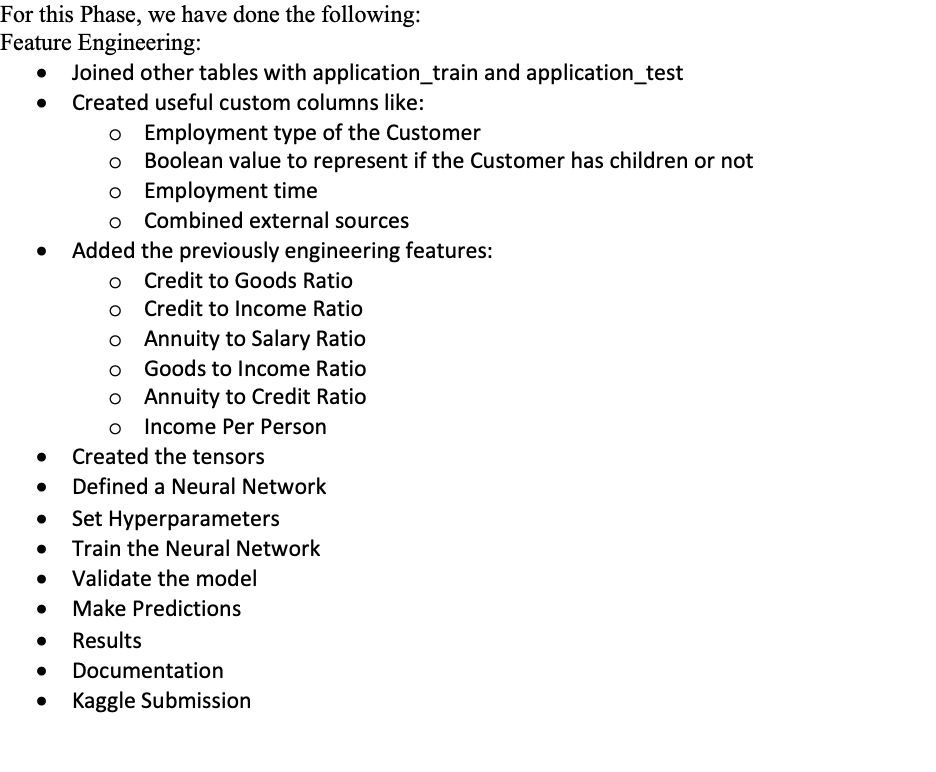

# Section 3.3: Understanding the Workflow

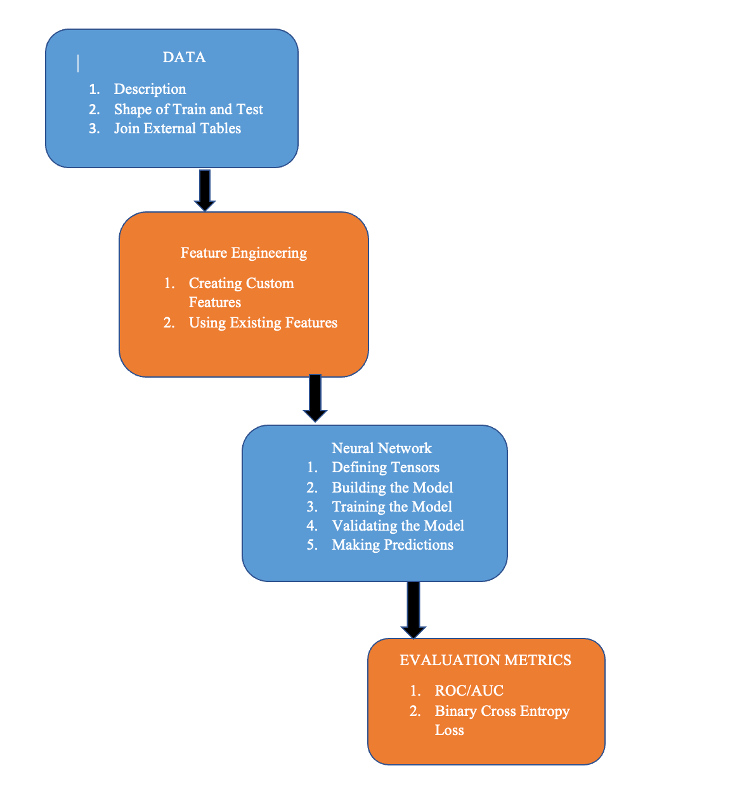

# Section 4 : Loading Data

In [ ]:
import numpy as np
import pandas as pd
import os
import random
import string
import torch
import torch.nn as nn
from torch.utils.data import Dataset, TensorDataset, DataLoader
from sklearn import preprocessing
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
application_train=pd.read_csv('gdrive/MyDrive/content/application_train.csv')
application_test=pd.read_csv('gdrive/MyDrive/content/application_test.csv')
# bureau=pd.read_csv('/content/bureau.csv')
# bureau_balance=pd.read_csv('/content/bureau_balance.csv')
# credit_card_balance=pd.read_csv('/content/credit_card_balance.csv')
previous_application=pd.read_csv('gdrive/MyDrive/content/previous_application.csv')
# POS_CASH_balance=pd.read_csv('/content/POS_CASH_balance.csv')
# installments_payments=pd.read_csv('installments_payments.csv')

In [ ]:
df = application_train.copy()
t_df = application_test.copy()

In [ ]:
application_train.shape

(307511, 122)

In [ ]:
t_df.shape

(48744, 121)

In [ ]:
df.shape

(307511, 122)

previous_application

In [ ]:
df['SK_ID_CURR'].nunique()

307511

In [ ]:
df.shape

(307511, 122)

In [ ]:
prev_app = previous_application.groupby('SK_ID_CURR', as_index=False).agg({'NAME_CONTRACT_STATUS': lambda x: ','.join(set(','.join(x).split(',')))})
prev_app['Appr'] = np.where(prev_app['NAME_CONTRACT_STATUS'] == 'Approved', '1', '0')
prev_app['Reject'] = np.where(prev_app['NAME_CONTRACT_STATUS'].str.contains('Refused'), '1', '0')


In [ ]:
prev_app

,SK_ID_CURR,NAME_CONTRACT_STATUS,Appr,Reject
0,100001,Approved,1,0
1,100002,Approved,1,0
2,100003,Approved,1,0
3,100004,Approved,1,0
4,100005,"Canceled,Approved",0,0
...,...,...,...,...
338852,456251,Approved,1,0
338853,456252,Approved,1,0
338854,456253,Approved,1,0
338855,456254,Approved,1,0


# Section 5: Merging Tables

In [ ]:
df = pd.merge(df, prev_app, on='SK_ID_CURR', how='left')
df.shape

(307511, 125)

In [ ]:
t_df= pd.merge(t_df, prev_app, on='SK_ID_CURR', how='left')
t_df.shape

(48744, 124)

In [ ]:
df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_STATUS,Appr,Reject
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0.0,0.0,0.0,0.0,0.0,1.0,Approved,1,0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0.0,0.0,0.0,0.0,0.0,0.0,Approved,1,0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,Approved,1,0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,NaN,NaN,NaN,NaN,NaN,NaN,"Canceled,Refused,Approved",0,1
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0.0,0.0,0.0,0.0,0.0,0.0,Approved,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,Approved,1,0
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,NaN,NaN,NaN,NaN,NaN,NaN,Approved,1,0
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,1.0,0.0,0.0,1.0,0.0,1.0,Approved,1,0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,Approved,1,0


In [ ]:
df['NAME_CONTRACT_STATUS']

0                          Approved
1                          Approved
2                          Approved
3         Canceled,Refused,Approved
4                          Approved
                    ...            
307506                     Approved
307507                     Approved
307508                     Approved
307509                     Approved
307510             Refused,Approved
Name: NAME_CONTRACT_STATUS, Length: 307511, dtype: object

# Section 6: Feature Engineering

In [ ]:
def credit_total(df):
    df['employeed'] = np.where(df['NAME_INCOME_TYPE'].isin(['Pensioner', 'Student', 'Unemployed']), '0', '1')
    df['kids_bool'] = np.where(df['CNT_CHILDREN'] > 0, '1', '0')
    return df

In [ ]:
df = credit_total(df)
t_df = credit_total(t_df)

In [ ]:
df['DAYS_EMPLOYED']

0           -637
1          -1188
2           -225
3          -3039
4          -3038
           ...  
307506      -236
307507    365243
307508     -7921
307509     -4786
307510     -1262
Name: DAYS_EMPLOYED, Length: 307511, dtype: int64

In [ ]:
def employment_time(row):
    if row['DAYS_EMPLOYED'] < 0:
        ed = abs(row['DAYS_EMPLOYED'])
    if ed < 30:
        return '1m'
    elif ed < 30*6:
        return '6m'
    elif ed < 365:
        return '1y'
    elif ed < 365*3:
        return '3y'
    elif ed < 365*5:
        return '5y'
    elif ed < 365*10:
        return '10y'
    elif ed < 365*20:
        return '20y'
    elif ed >= 365*20:
        return 'maxy'
    else:
        return 'NA'
df['employment_time'] = df.apply(employment_time, axis=1)
t_df['employment_time'] = t_df.apply(employment_time, axis=1)

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_STATUS,Appr,Reject,employeed,kids_bool,employment_time
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.0,0.0,0.0,1.0,Approved,1,0,1,0,3y
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,0.0,0.0,0.0,Approved,1,0,1,0,5y
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,0.0,Approved,1,0,1,0,1y
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,NaN,NaN,NaN,NaN,"Canceled,Refused,Approved",0,1,1,0,10y
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,0.0,Approved,1,0,1,0,10y


In [ ]:

t_df.shape

(48744, 127)

In [ ]:
df.shape

(307511, 128)

In [ ]:
#custom_ext_source_3
def Ext_source(x):
    if str(x) != 'nan':
        if x < 0.1:
            return '1ext'
        elif x < 0.2:
            return '2ext'
        elif x < 0.3:
            return '3ext'
        elif x < 0.4:
            return '4ext'
        elif x < 0.5:
            return '5ext'
        elif x < 0.6:
            return '6ext'
        elif x < 0.7:
            return '7ext'
        elif x < 0.8:
            return '8ext'
        elif x < 0.9:
            return '9ext'
        elif x <= 1:
            return '10ext'
    else:
        return 'NA'


In [ ]:
df['c_ext_source_1'] = df['EXT_SOURCE_1'].apply(lambda x:Ext_source(x))
df['c_ext_source_2'] = df['EXT_SOURCE_2'].apply(lambda x: Ext_source(x))
df['c_ext_source_3'] = df['EXT_SOURCE_3'].apply(lambda x: Ext_source(x))
t_df['c_ext_source_1'] = t_df['EXT_SOURCE_1'].apply(lambda x: Ext_source(x))
t_df['c_ext_source_2'] = t_df['EXT_SOURCE_2'].apply(lambda x: Ext_source(x))
t_df['c_ext_source_3'] = t_df['EXT_SOURCE_3'].apply(lambda x: Ext_source(x))

In [ ]:
df.shape

(307511, 131)

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_STATUS,Appr,Reject,employeed,kids_bool,employment_time,c_ext_source_1,c_ext_source_2,c_ext_source_3
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,1.0,Approved,1,0,1,0,3y,1ext,3ext,2ext
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,Approved,1,0,1,0,5y,4ext,7ext,NA
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,Approved,1,0,1,0,1y,NA,6ext,8ext
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,NaN,"Canceled,Refused,Approved",0,1,1,0,10y,NA,7ext,NA
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,Approved,1,0,1,0,10y,NA,4ext,NA


In [ ]:
df['employeed']

0         1
1         1
2         1
3         1
4         1
         ..
307506    1
307507    0
307508    1
307509    1
307510    1
Name: employeed, Length: 307511, dtype: object

In [ ]:
df["NAME_INCOME_TYPE"]

0                      Working
1                State servant
2                      Working
3                      Working
4                      Working
                  ...         
307506                 Working
307507               Pensioner
307508                 Working
307509    Commercial associate
307510    Commercial associate
Name: NAME_INCOME_TYPE, Length: 307511, dtype: object

In [ ]:
df.shape

(307511, 131)

In [ ]:
t_df.shape

(48744, 130)

In [ ]:
def old_features(X_feature):
    X_feature['Annuity_to_salary_ratio'] = X_feature['AMT_ANNUITY']/X_feature['AMT_INCOME_TOTAL']
    X_feature['PAYMENT_RATE'] = X_feature['AMT_ANNUITY'] / X_feature['AMT_CREDIT']
    X_feature['GOODS_INCOME'] =  X_feature['AMT_GOODS_PRICE']/X_feature['AMT_INCOME_TOTAL']
    X_feature['Credit_Income'] = X_feature['AMT_CREDIT']/X_feature['AMT_INCOME_TOTAL']
    X_feature['INCOME_PER_PERSON'] = X_feature['AMT_INCOME_TOTAL']/X_feature['CNT_FAM_MEMBERS']
    X_feature['NEW_CREDIT_TO_GOODS_RATIO'] = X_feature['AMT_CREDIT'] / X_feature['AMT_GOODS_PRICE']
    #X_feature['Employed_Birth'] = X_feature['DAYS_EMPLOYED']/X_feature['DAYS_BIRTH']
    #X_feature['NEW_SOURCES_PROD'] =  X_feature['EXT_SOURCE_2'] * X_feature['EXT_SOURCE_3']
    #X_feature['NEW_PHONE_TO_BIRTH_RATIO'] = X_feature['DAYS_LAST_PHONE_CHANGE'] / X_feature['DAYS_EMPLOYED']
    return X_feature

In [ ]:
df = old_features(df)
t_df = old_features(t_df)

In [ ]:
# seperating categorical and numerical data
def features(df):
    cat_features = []
    num_features = []
    for column in df.columns:
        if df[column].dtype == 'object':
            cat_features.append(column) 
        elif not df[column].dtype == 'object':
            num_features.append(column)
    return cat_features, num_features

In [ ]:
cat_features, num_features = features(df)
cat_features_test, num_features_test = features(t_df)

In [ ]:
len(cat_features)

25

In [ ]:
len(cat_features_test)

25

In [ ]:
len(num_features)

112

In [ ]:
len(num_features_test)

111

In [ ]:
df.shape

(307511, 137)

In [ ]:
l = list(df[num_features].isnull().sum())
nonzeroind = np.nonzero(l)[0]
print(len(nonzeroind))

66


In [ ]:
# Handle missing values
def fill_null_vals(df, num_features, cat_features):
    for feature in cat_features:
        df[feature].fillna('NULL', inplace=True)
    for column in num_features:
        if df[column].isnull().values.any():
            df[column + '_nullvals'] = np.where(df[column].isnull(), '1', '0')
            df[column].fillna(value=df[column].median(), inplace=True)
    return df

In [ ]:
df = fill_null_vals(df, num_features, cat_features)
t_df = fill_null_vals(t_df, num_features_test, cat_features_test)

In [ ]:
df.shape

(307511, 203)

In [ ]:
t_df.shape

(48744, 196)

In [ ]:
# Standardizing the dataset
min_max_scaler = preprocessing.MinMaxScaler()
def standardise(df, num_features, cat_features):
    for feature in cat_features:
        df[feature] = preprocessing.LabelEncoder().fit_transform(df[feature].astype(str))
        df[feature] = df[feature].astype('category')
    df[num_features] = pd.DataFrame(min_max_scaler.fit_transform(df[num_features]))
    return df

In [ ]:
df = standardise(df, num_features, cat_features)
t_df = standardise(t_df, num_features_test, cat_features_test)

In [ ]:
df.shape

(307511, 203)

In [ ]:
t_df.shape

(48744, 196)

# Section 7: MultiLayer Perceptron

# Section 7.1 :Splitting into train and test

In [ ]:
df_train = df.drop(columns = 'TARGET')
df_train_target = pd.DataFrame(df['TARGET'], columns=['TARGET'])
x_train, x_validation, y_train, y_validation = train_test_split(df_train, df_train_target, test_size=0.2, random_state=42)

In [ ]:
x_train.shape

(246008, 202)

# Section 7.2: Create Tensors

In [ ]:
def tensors(df):
    temp = []
    for column in df.columns:
        if df.dtypes[column] == np.int64:
            temp.append(df[column].astype(np.float64))
        elif df.dtypes[column] == np.float64:
            temp.append(df[column].astype(np.float64))
        else:
            temp.append(df[column].cat.codes.values)
    return torch.tensor(np.stack(temp, 1), dtype=torch.float)

In [ ]:
num_features.remove('TARGET')

In [ ]:
tensor_x_train_cat = tensors(x_train[cat_features]).float()
tensor_x_train_num = tensors(x_train[num_features]).float()
tensor_y_train = torch.tensor(y_train.values).flatten().float()

tensor_x_valid_cat = tensors(x_validation[cat_features]).float()
tensor_x_valid_num = tensors(x_validation[num_features]).float()
tensor_y_valid = torch.tensor(y_validation.values).flatten().float()

In [ ]:

tensor_y_train.shape

torch.Size([246008])

In [ ]:
cat_emb_sizes = [(feature_size, min(50, (feature_size + 1) // 2)) for feature_size in [len(df[column].cat.categories) for column in cat_features]]

torch.Size([246008])

# Section 7.3: Constructing the Neural Network Model

In [ ]:
class NNModel(nn.Module):
    def __init__(self, embedding_size, input_size, num_numerical_cols, layers):
        super().__init__()

        self.all_embeddings = nn.ModuleList([nn.Embedding(ni, nf) for ni, nf in embedding_size])

        self.bn_cont = nn.BatchNorm1d(num_numerical_cols)

        layerlist = []
        for i, elem in enumerate(layers):
            layerlist.append(nn.Linear(input_size, elem))
            layerlist.append(nn.ReLU(inplace=True))
            layerlist.append(nn.BatchNorm1d(layers[i]))
            input_size = elem
        layerlist.append(nn.Linear(layers[-1], 1))

        self.layers = nn.Sequential(*layerlist)

    def forward(self, x_c, x_n):
        
        embeddings = [e(x_c[:,i].long()) for i, e in enumerate(self.all_embeddings)]

        x = torch.cat(embeddings, 1)

        x_n = self.bn_cont(x_n)

        x = torch.cat([x, x_n], 1)
        x = self.layers(x)

        return x

# Section 7.4: Defining Hyperparameters

In [ ]:
size_batch = 100
lr= 0.00001
layers_list = [512, 256,128]


# INSTANCIATE MODEL
no_num_cols = tensor_x_train_num.shape[1]
no_cat_cols = sum((nf for ni, nf in cat_emb_sizes))

start_ip_size = no_cat_cols + no_num_cols

mlp_model = NNModel(cat_emb_sizes, start_ip_size, no_num_cols, layers=layers_list)
sigmoid = nn.Sigmoid()
loss_function = nn.BCELoss()
optimizer = torch.optim.Adam(mlp_model.parameters(), lr=lr)


# Section 7.5: Training the Neural Network

In [ ]:
train_tensor_dataset = TensorDataset(tensor_x_train_cat, tensor_x_train_num, tensor_y_train)
train_loader = DataLoader(dataset=train_tensor_dataset, batch_size=size_batch, shuffle=True)
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

mlp_model.train()

tot_y_train_in = []
tot_y_train_out = []

for epoch in range(50):
    train_losses = []
    for x_cat, x_num, y in train_loader:
        y_train = mlp_model(x_cat, x_num)
        single_loss = loss_function(sigmoid(y_train.squeeze()), y)
        writer.add_scalar("Loss/train", single_loss, epoch)
        single_loss.backward() 
        optimizer.step()
        train_losses.append(single_loss.item())
        tot_y_train_in.append(y)
        tot_y_train_out.append(y_train)
    
    epoch_loss = 1.0 * sum(train_losses) / len(train_losses)
    epoch_auc = roc_auc_score(torch.cat(tot_y_train_in).cpu().numpy(), torch.cat(tot_y_train_out).cpu().detach().numpy())
    tot_y_train_in = []
    tot_y_train_out = []
    print("\tepoch: " + str(epoch) + "\tloss: " + str(epoch_loss) + "\tauc: " + str(epoch_auc))

	epoch: 0	loss: 0.6416446261413695	auc: 0.6844062286658417
	epoch: 1	loss: 0.48187918594725393	auc: 0.7056959375019145
	epoch: 2	loss: 0.3382289266922957	auc: 0.7161976306146771
	epoch: 3	loss: 0.262866575575151	auc: 0.7389413042162595
	epoch: 4	loss: 0.24748338373852474	auc: 0.754657657236243
	epoch: 5	loss: 0.2609688901970271	auc: 0.7630487077386029
	epoch: 6	loss: 0.2795644884082129	auc: 0.7663942815897067
	epoch: 7	loss: 0.29293438863071275	auc: 0.7686232674439021
	epoch: 8	loss: 0.30140684910303256	auc: 0.76861793126227
	epoch: 9	loss: 0.3104106230780101	auc: 0.7687169418608629
	epoch: 10	loss: 0.3211351639157095	auc: 0.7665103924878351
	epoch: 11	loss: 0.32762735655507824	auc: 0.7659521823678198
	epoch: 12	loss: 0.3352730697863279	auc: 0.7648620309859003
	epoch: 13	loss: 0.33563850172944837	auc: 0.7638198058972298
	epoch: 14	loss: 0.3347531173821752	auc: 0.7630335727976583
	epoch: 15	loss: 0.33251001987392853	auc: 0.7658565418135557
	epoch: 16	loss: 0.3283024870407189	auc: 0.7643

In [ ]:
writer.flush()
writer.close()

# Section 7.6: Tensorboard Visualization of the Training

In [ ]:

%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2552), started 1:45:47 ago. (Use '!kill 2552' to kill it.)

<IPython.core.display.Javascript object>

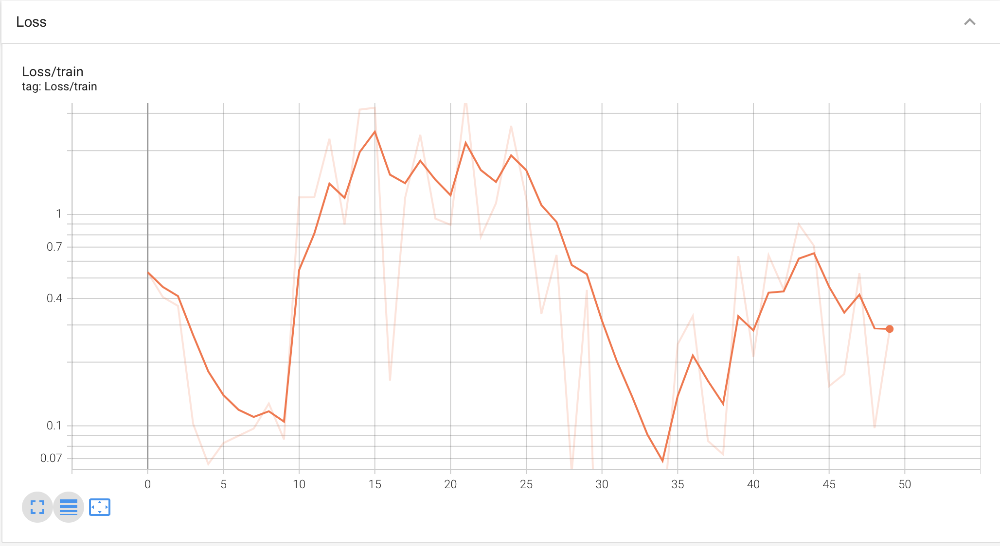

# Section 7.7: Validating the Model

In [ ]:
tensor_validation = TensorDataset(tensor_x_valid_cat, tensor_x_valid_num, tensor_y_valid)
load_valid = DataLoader(dataset=tensor_validation, batch_size=size_batch, shuffle=True)

valid_losses = []

mlp_model.eval()

tot_y_valid_in = []
tot_y_valid_out = []

with torch.no_grad():
    for x_cat, x_num, y in load_valid:
        y_valid = mlp_model(x_cat, x_num)
        validation_loss = loss_function(sigmoid(y_valid.squeeze()), y)
        valid_losses.append(validation_loss.item())

        tot_y_valid_in.append(y_valid)
        tot_y_valid_out.append(y)

    valid_loss = round(1.0 * sum(valid_losses) / len(valid_losses), 5)
    print("\tloss: " + str(valid_loss))
    valid_auc = roc_auc_score(torch.cat(tot_y_valid_out).cpu(), torch.cat(tot_y_valid_in).cpu())
    print("\tauc: " + str(valid_auc))



	loss: 0.57319
	auc: 0.7405733355924455


In [ ]:
mlp_model

NNModel(
  (all_embeddings): ModuleList(
    (0): Embedding(2, 1)
    (1): Embedding(3, 2)
    (2): Embedding(2, 1)
    (3): Embedding(2, 1)
    (4): Embedding(8, 4)
    (5): Embedding(8, 4)
    (6): Embedding(5, 3)
    (7): Embedding(6, 3)
    (8): Embedding(6, 3)
    (9): Embedding(19, 10)
    (10): Embedding(7, 4)
    (11): Embedding(58, 29)
    (12): Embedding(5, 3)
    (13): Embedding(4, 2)
    (14): Embedding(8, 4)
    (15): Embedding(3, 2)
    (16): Embedding(18, 9)
    (17): Embedding(3, 2)
    (18): Embedding(3, 2)
    (19): Embedding(2, 1)
    (20): Embedding(2, 1)
    (21): Embedding(9, 5)
    (22): Embedding(11, 6)
    (23): Embedding(10, 5)
    (24): Embedding(10, 5)
  )
  (bn_cont): BatchNorm1d(111, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layers): Sequential(
    (0): Linear(in_features=223, out_features=512, bias=True)
    (1): ReLU(inplace=True)
    (2): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): 

In [ ]:
test_df=t_df
data =test_df[cat_features]
np.array(data).shape

(48744, 25)

In [ ]:
test_df.shape

(48744, 196)

In [ ]:
tensor_x_test_cat = tensors(test_df[cat_features].astype('category')).float()
tensor_x_test_num = tensors(test_df[num_features]).float()

# Section 7.8: Making Predictions

In [ ]:
import torch.nn.functional as F
print("MAKING PREDICTIONS...")
preds=[]
with torch.no_grad():
    y_test = mlp_model(tensor_x_test_cat, tensor_x_test_num)
    prob = F.softmax(y_test, dim=1)
    preds.append(prob)
    
preds

MAKING PREDICTIONS...


[tensor([[1.],
         [1.],
         [1.],
         ...,
         [1.],
         [1.],
         [1.]])]

In [ ]:
nn_prediction_df

,SK_ID_CURR,TARGET
0,100001,0.214511
1,100005,0.214511
2,100013,0.214511
3,100028,0.214511
4,100038,0.214511
...,...,...
48739,456221,0.214511
48740,456222,0.214511
48741,456223,0.174935
48742,456224,0.214511


# Section 8: Leakage

# Section 8.1: Leakage Details

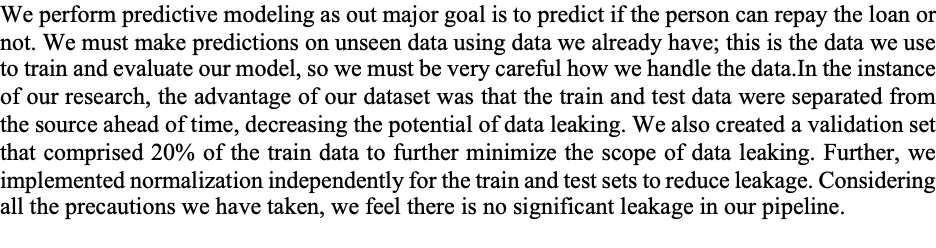

# Section 8.2: Violation of Cardinal Sins of ML

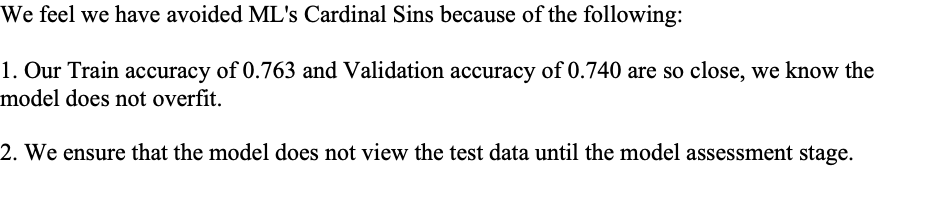

# Section 9: Modelling Pipelines

# Section 9.1: Visualization of Modelling Pipeline

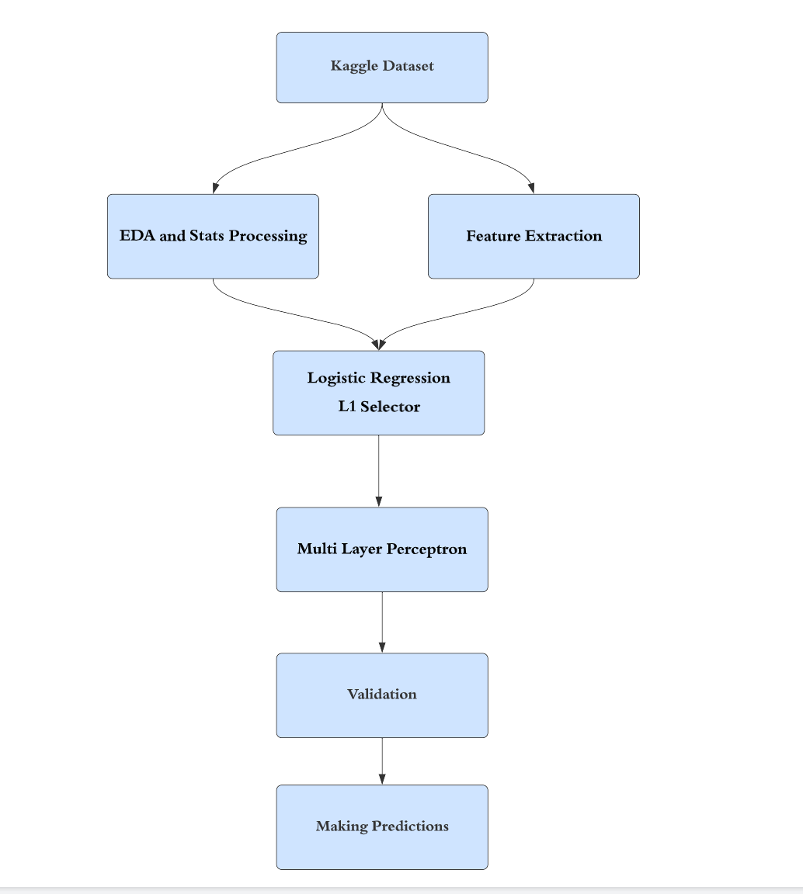

# Section 9.2: Families of input features and count per family

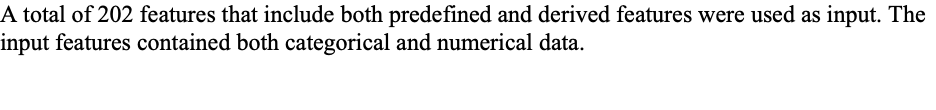

# Section 9.3: Hyperparameters and Settings Considered

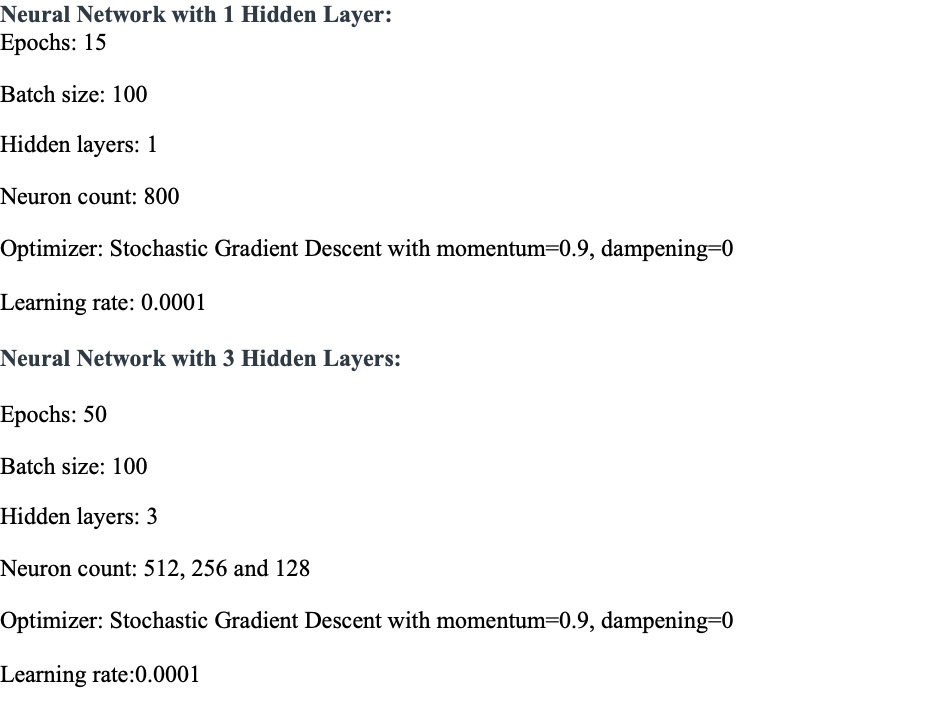

# Section 9.4: Loss function used in latex

In [6]:
%%latex

\begin{gather}

l(x,y) = L = l_1, ..... , l_N^{\;T}\\
l_n = -w_n\:[\:y_n.log\sigma\:(x_n)\:+\:(1-y_n).log(1-\sigma\:(x_n)\:)\:]\:
\ where\ N\ is\ the\ batch\ size\

\end{gather}

<IPython.core.display.Latex object>

In [7]:
%%latex

\begin{gather}

Accuracy = \frac{True_{Postivies} + True_{Negatives}}{True_{Postivies} + True_{Negatives} + False_{Positives} + False_{Negatives}}

\end{gather}

<IPython.core.display.Latex object>

# Section 9.5: Number of experiments conducted

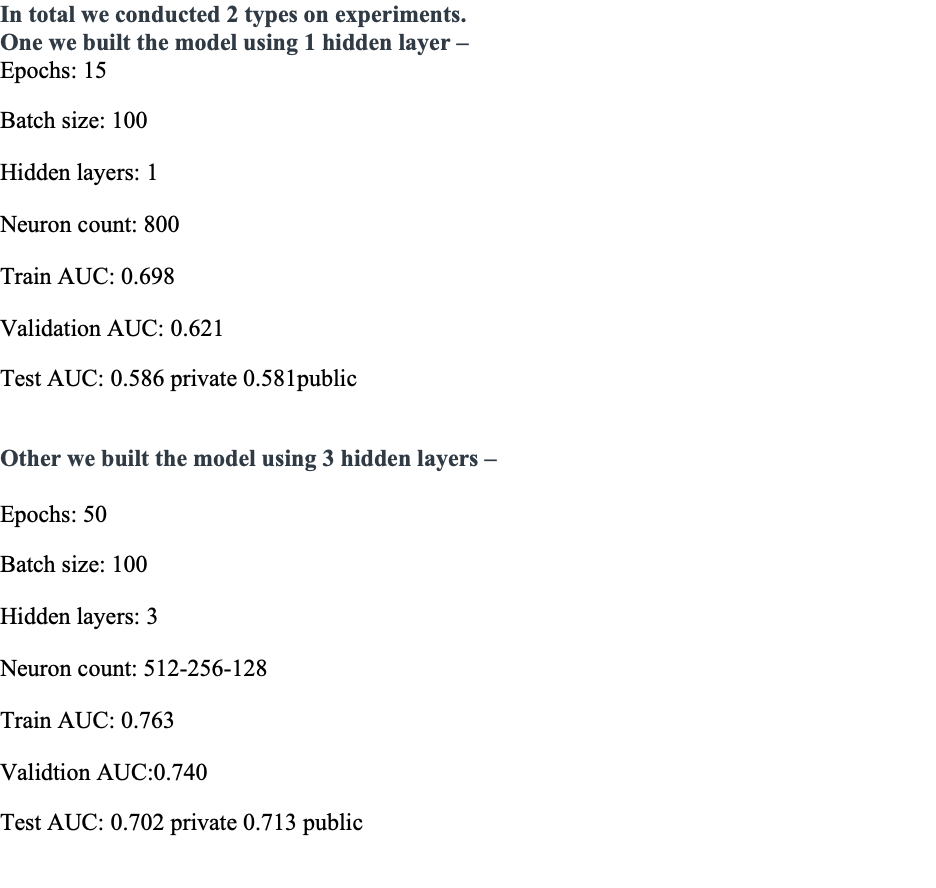

# Section 9.6: Experiment table

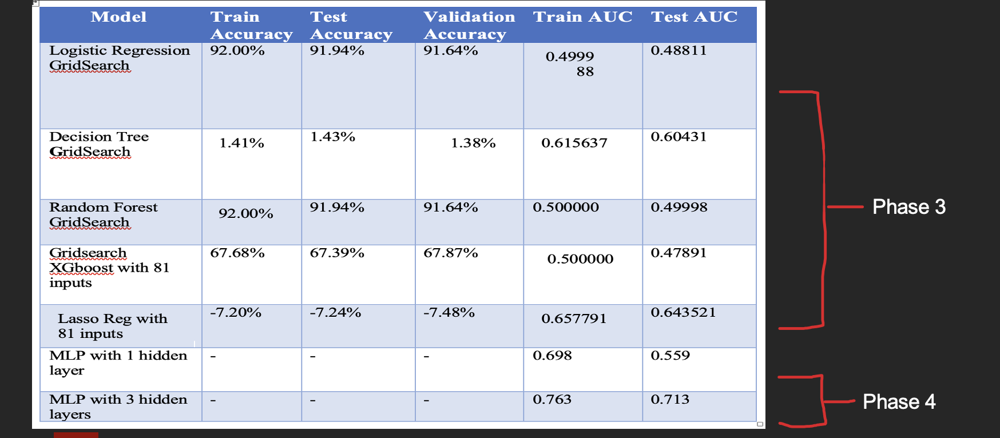

# Section 10: Results and Discussions

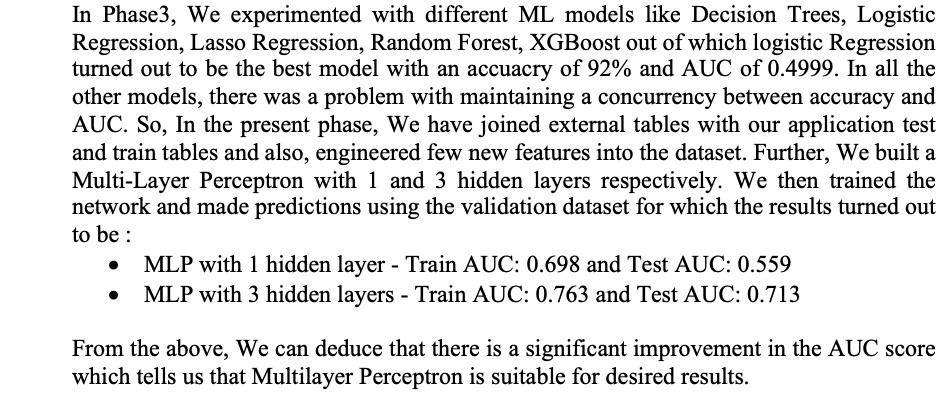

# Section 11: Conclusion

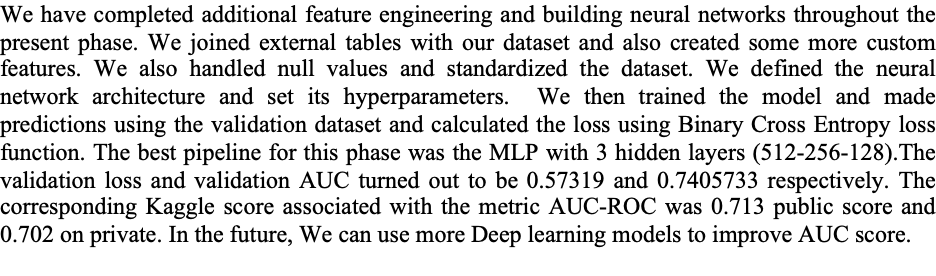

# Section 12: Kaggle Submission

In [ ]:
#GENERATE SUBMISSION.csv
print("GENERATING SUBMISSIONS...")
nn_prediction_df = pd.DataFrame(y_test).astype("float")
x_scaled = min_max_scaler.fit_transform(nn_prediction_df)
nn_prediction_df = pd.DataFrame(x_scaled)
nn_prediction_df = pd.concat([nn_prediction_df, application_test['SK_ID_CURR']], axis=1)
nn_prediction_df.columns = ['TEMP_TARGET', 'SK_ID_CURR']
nn_prediction_df['TARGET'] = nn_prediction_df['TEMP_TARGET']
nn_prediction_df = nn_prediction_df[['SK_ID_CURR', 'TARGET']]
nn_prediction_df.to_csv('./submission.csv', index=False)

print("EXECUTION COMPLETED.")

GENERATING SUBMISSIONS...
EXECUTION COMPLETED.


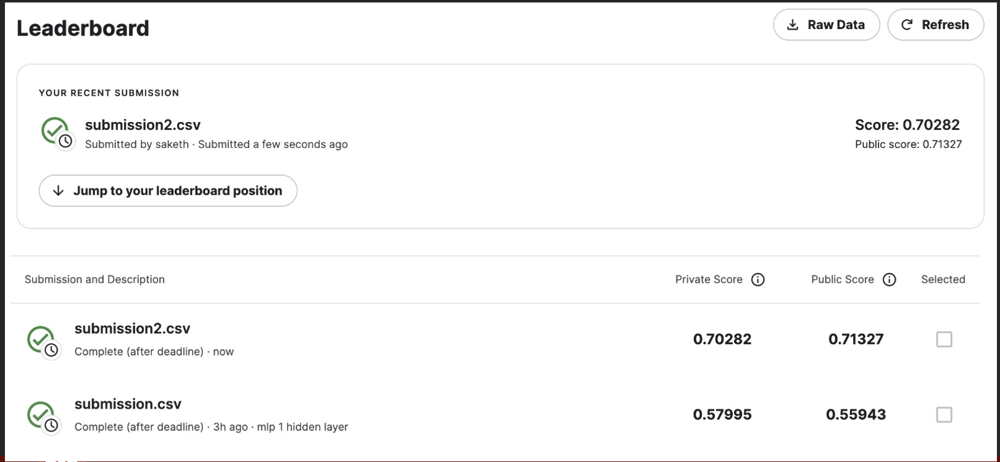